In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import subprocess
import os
from sklearn.cluster import DBSCAN

plt.rcParams['figure.figsize'] = (12, 8)

# Ensure output directory exists
Path("visualizations").mkdir(exist_ok=True)

In [2]:
# Clone or locate dataset
REPO_URL = "https://github.com/zapdos-labs/technical-interview.git"
DATA_DIR = "./zapdos_data"

if not os.path.exists(DATA_DIR):
    print("Cloning repository...")
    subprocess.run(["git", "clone", REPO_URL, DATA_DIR], capture_output=True)
    print(f"✓ Repository cloned to {DATA_DIR}")
else:
    print(f"✓ Data directory already exists at {DATA_DIR}")

data_path = Path(DATA_DIR) / "data"
if not data_path.exists():
    raise FileNotFoundError(f"Expected data folder not found at {data_path}")

clips = sorted([d for d in data_path.iterdir() if d.is_dir()])
print(f"\n✓ Found {len(clips)} clips:")
for clip in clips:
    video_path = clip / "main.mp4"
    if video_path.exists():
        size_mb = video_path.stat().st_size / (1024*1024)
        print(f"  - {clip.name} ({size_mb:.1f} MB)")
    else:
        print(f"  - {clip.name} (main.mp4 missing)")

✓ Data directory already exists at ./zapdos_data

✓ Found 30 clips:
  - clip_01_view_0 (0.1 MB)
  - clip_01_view_1 (0.2 MB)
  - clip_01_view_2 (0.2 MB)
  - clip_02_view_0 (0.1 MB)
  - clip_02_view_1 (0.2 MB)
  - clip_02_view_2 (0.3 MB)
  - clip_03_view_0 (0.2 MB)
  - clip_03_view_1 (0.2 MB)
  - clip_03_view_2 (0.2 MB)
  - clip_04_view_0 (0.1 MB)
  - clip_04_view_1 (0.2 MB)
  - clip_04_view_2 (0.3 MB)
  - clip_05_view_0 (0.2 MB)
  - clip_05_view_1 (0.2 MB)
  - clip_05_view_2 (0.2 MB)
  - clip_06_view_0 (0.1 MB)
  - clip_06_view_1 (0.2 MB)
  - clip_06_view_2 (0.3 MB)
  - clip_07_view_0 (0.2 MB)
  - clip_07_view_1 (0.4 MB)
  - clip_07_view_2 (0.3 MB)
  - clip_08_view_0 (0.1 MB)
  - clip_08_view_1 (0.3 MB)
  - clip_08_view_2 (0.3 MB)
  - clip_09_view_0 (0.1 MB)
  - clip_09_view_1 (0.3 MB)
  - clip_09_view_2 (0.3 MB)
  - clip_10_view_0 (0.1 MB)
  - clip_10_view_1 (0.4 MB)
  - clip_10_view_2 (0.4 MB)


In [3]:
# Detection functions (same as before, with clustering)

def get_red_mask(frame):
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    hsv = cv2.GaussianBlur(hsv, (5,5), 0)
    lower1 = np.array([0, 100, 100])
    upper1 = np.array([10, 255, 255])
    lower2 = np.array([170, 100, 100])
    upper2 = np.array([180, 255, 255])
    mask = cv2.bitwise_or(cv2.inRange(hsv, lower1, upper1),
                          cv2.inRange(hsv, lower2, upper2))
    return mask

def cluster_red_pixels(red_mask, eps=50, min_samples=30):
    pts = np.column_stack(np.where(red_mask > 0))
    if len(pts) == 0:
        return []
    clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(pts)
    labels = clustering.labels_
    clusters = []
    for label in set(labels):
        if label == -1:
            continue
        cluster_pts = pts[labels == label]
        clusters.append(cluster_pts)
    return clusters

def clusters_to_boxes(clusters, min_box_area=5000):
    boxes = []
    for pts in clusters:
        y_min, x_min = pts.min(axis=0)
        y_max, x_max = pts.max(axis=0)
        h = y_max - y_min
        w = x_max - x_min
        if w * h >= min_box_area:
            boxes.append((x_min, y_min, w, h))
    return boxes

def filter_by_red_density(boxes, red_mask, max_ratio=0.25):
    filtered = []
    for (x,y,w,h) in boxes:
        roi = red_mask[y:y+h, x:x+w]
        if roi.size == 0:
            continue
        ratio = np.count_nonzero(roi) / (w*h)
        if ratio <= max_ratio:
            filtered.append((x,y,w,h))
    return filtered

def detect_laser_boxes(frame):
    red_mask = get_red_mask(frame)
    clusters = cluster_red_pixels(red_mask, eps=50, min_samples=30)
    boxes = clusters_to_boxes(clusters, min_box_area=5000)
    boxes = filter_by_red_density(boxes, red_mask, max_ratio=0.25)
    return boxes, red_mask

In [4]:
def process_clip(clip_path, target_fps=10, visualize=True):
    """
    Process a single clip: generate output mask video and optionally visualise some frames.
    Returns list of (frame_index, original_frame, red_mask, boxes, output_mask) for visualisation.
    """
    video_path = clip_path / "main.mp4"
    if not video_path.exists():
        print(f"Video not found: {video_path}")
        return None
    
    cap = cv2.VideoCapture(str(video_path))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    out_fps = target_fps if target_fps else fps
    
    output_video = clip_path / "output_mask.mp4"
    out = cv2.VideoWriter(str(output_video), cv2.VideoWriter_fourcc(*'mp4v'),
                          out_fps, (width, height), isColor=False)
    
    frame_count = 0
    viz_frames = []  # store (idx, frame, red_mask, boxes, out_mask)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Indices for visualisation: first, middle, last (if available)
    viz_indices = set()
    if total_frames > 0:
        viz_indices.add(0)
        viz_indices.add(total_frames // 2)
        viz_indices.add(total_frames - 1)
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        boxes, red_mask = detect_laser_boxes(frame)
        output_mask = np.zeros((height, width), dtype=np.uint8)
        for (x,y,w,h) in boxes:
            cv2.rectangle(output_mask, (x,y), (x+w, y+h), 255, cv2.FILLED)
        
        out.write(output_mask)
        
        if visualize and frame_count in viz_indices:
            viz_frames.append((frame_count, frame.copy(), red_mask.copy(), boxes.copy(), output_mask.copy()))
        
        frame_count += 1
        if frame_count % 100 == 0:
            print(f"  Processed {frame_count} frames")
    
    cap.release()
    out.release()
    print(f"  ✓ Output mask saved to {output_video}")
    return viz_frames

In [7]:
def plot_viz_frames(clip_name, viz_frames, save=True):
    """
    Create a 4-panel plot for each visualisation frame and optionally save.
    """
    if not viz_frames:
        return
    
    for (idx, frame, red_mask, boxes, output_mask) in viz_frames:
        # Overlay boxes on original frame
        vis = frame.copy()
        for (x,y,w,h) in boxes:
            cv2.rectangle(vis, (x,y), (x+w, y+h), (0,255,0), 2)
        
        fig, axes = plt.subplots(1, 4, figsize=(16, 5))
        axes[0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        axes[0].set_title("Original Frame")
        axes[0].axis('off')
        
        axes[1].imshow(red_mask, cmap='gray')
        axes[1].set_title("Red Mask")
        axes[1].axis('off')
        
        axes[2].imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
        axes[2].set_title("Detected Boxes")
        axes[2].axis('off')
        
        axes[3].imshow(output_mask, cmap='gray')
        axes[3].set_title("Output Mask (filled)")
        axes[3].axis('off')
        
        plt.suptitle(f"{clip_name} - Frame {idx}")
        plt.tight_layout()
        
        # if save:
            # out_path = Path("visualizations") / f"{clip_name}_frame{idx}.png"
            # plt.savefig(out_path, dpi=100, bbox_inches='tight')
            # print(f"  Saved plot to {out_path}")
        
        plt.show()
        plt.close()


--- Processing clip_01_view_0 ---
  ✓ Output mask saved to zapdos_data\data\clip_01_view_0\output_mask.mp4


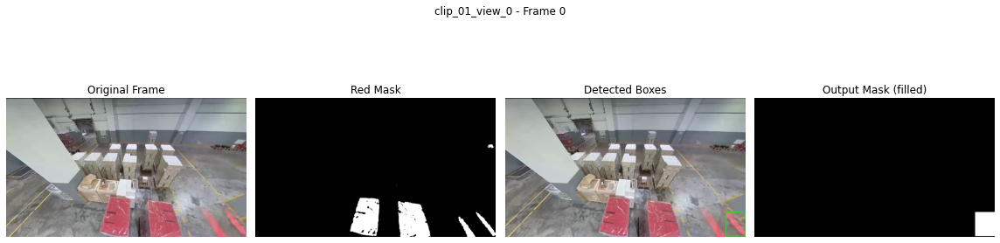

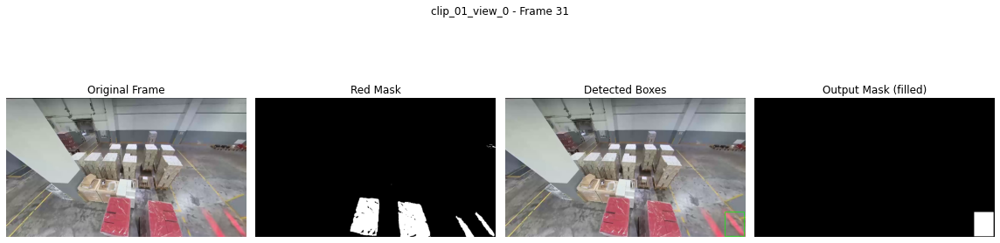

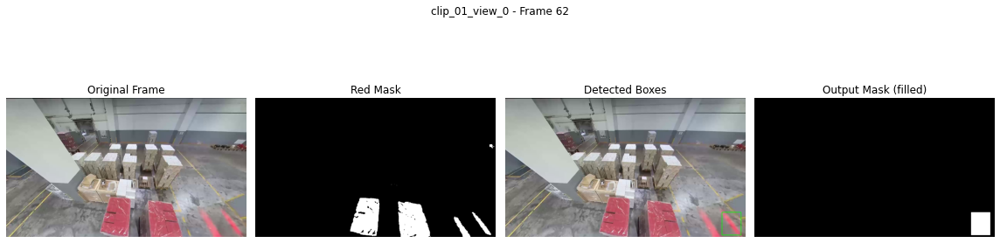


--- Processing clip_01_view_1 ---
  ✓ Output mask saved to zapdos_data\data\clip_01_view_1\output_mask.mp4


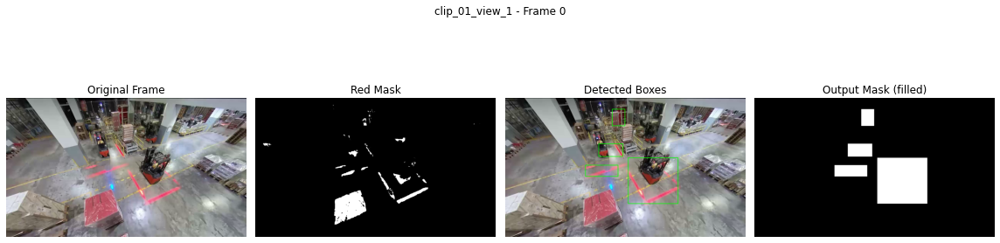

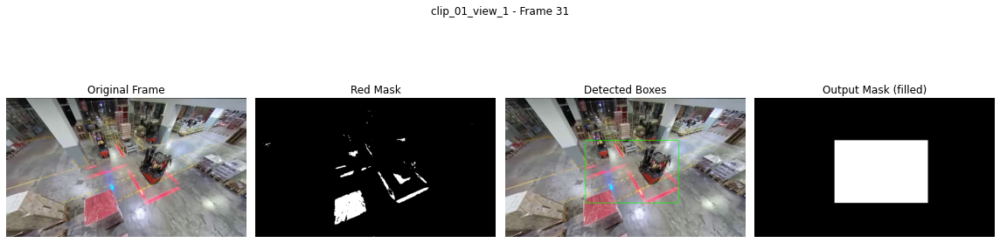

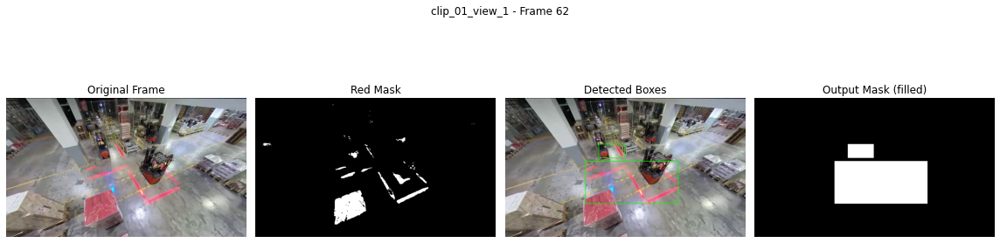


--- Processing clip_01_view_2 ---
  ✓ Output mask saved to zapdos_data\data\clip_01_view_2\output_mask.mp4


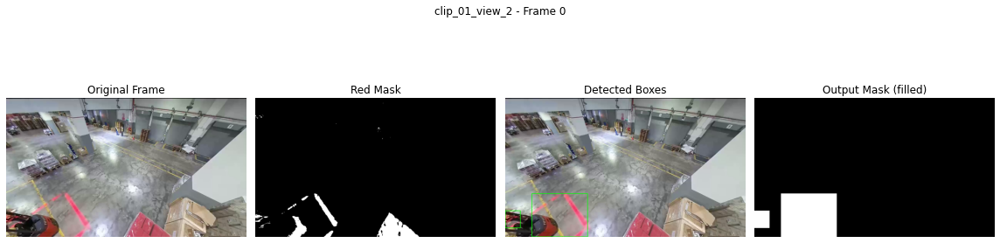

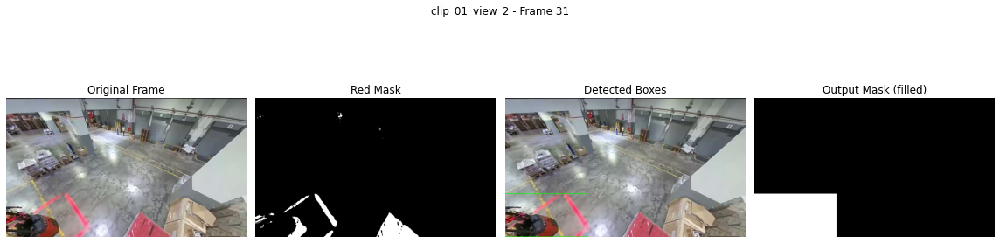

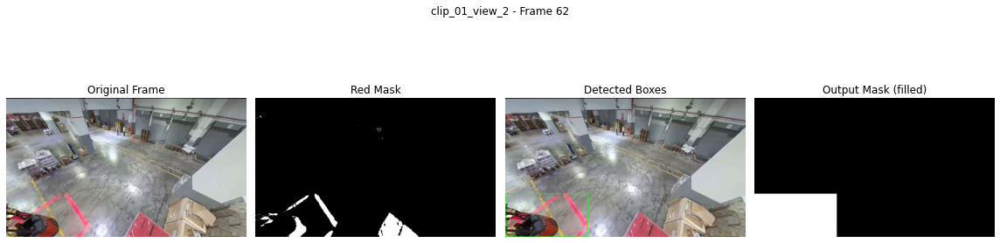


--- Processing clip_02_view_0 ---
  ✓ Output mask saved to zapdos_data\data\clip_02_view_0\output_mask.mp4


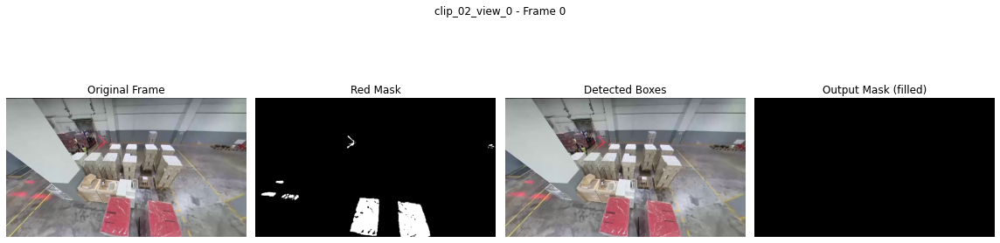

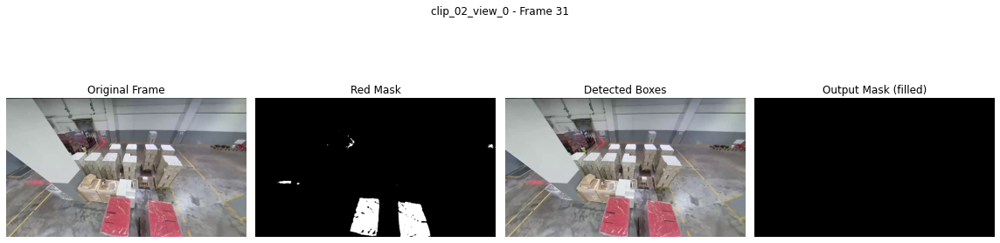

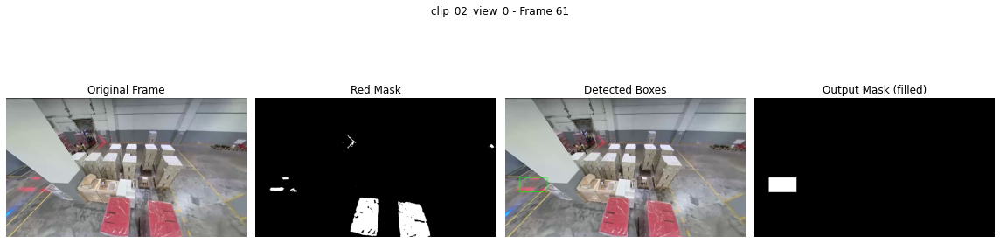


--- Processing clip_02_view_1 ---
  ✓ Output mask saved to zapdos_data\data\clip_02_view_1\output_mask.mp4


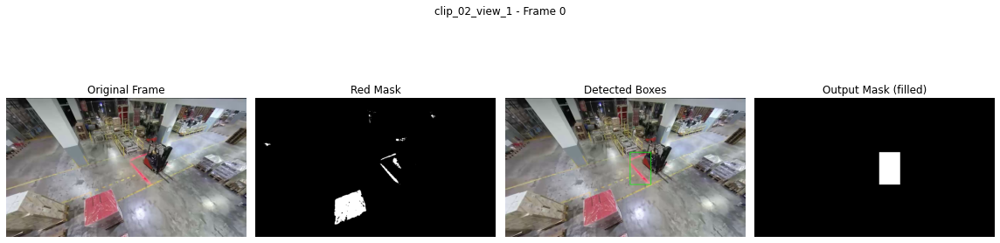

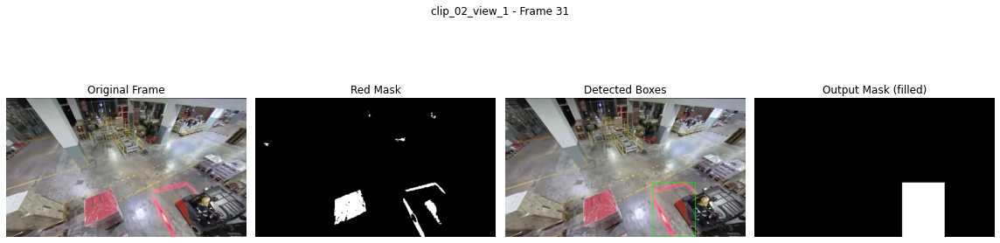

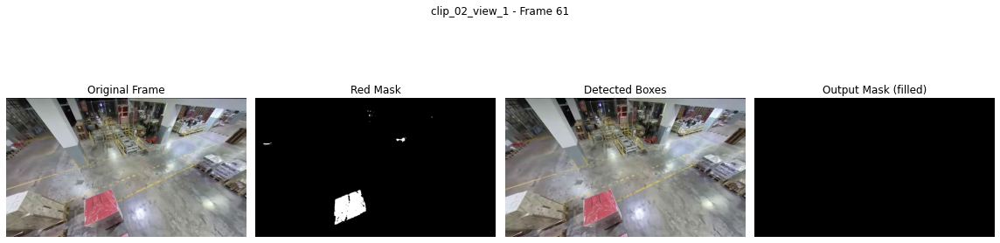


--- Processing clip_02_view_2 ---
  ✓ Output mask saved to zapdos_data\data\clip_02_view_2\output_mask.mp4


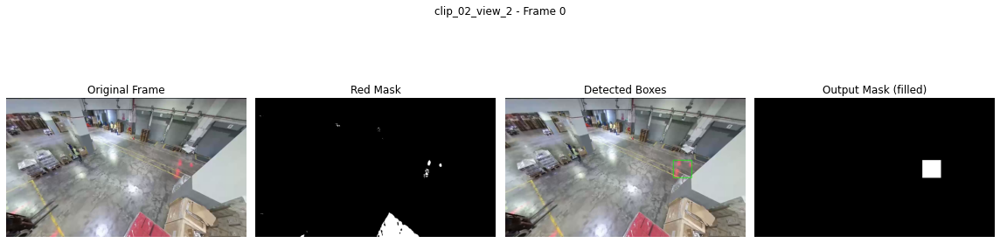

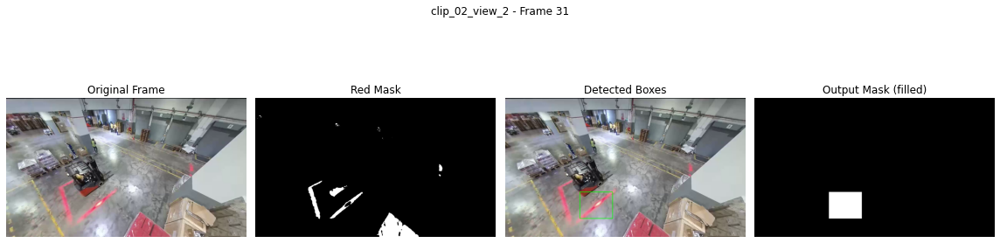

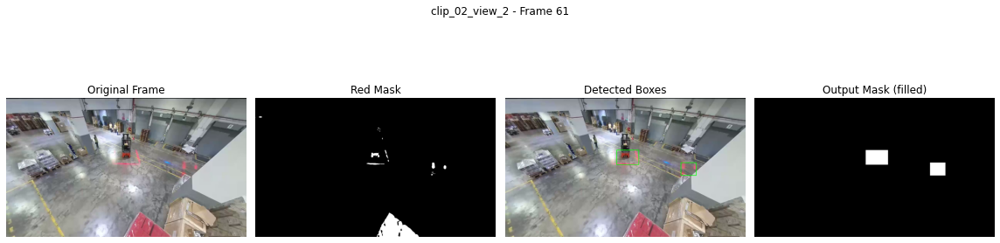


--- Processing clip_03_view_0 ---
  ✓ Output mask saved to zapdos_data\data\clip_03_view_0\output_mask.mp4


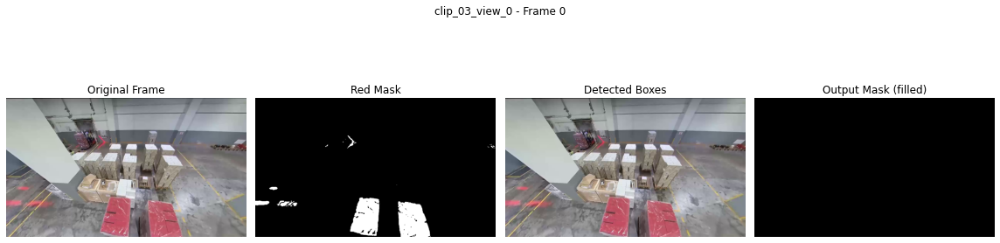

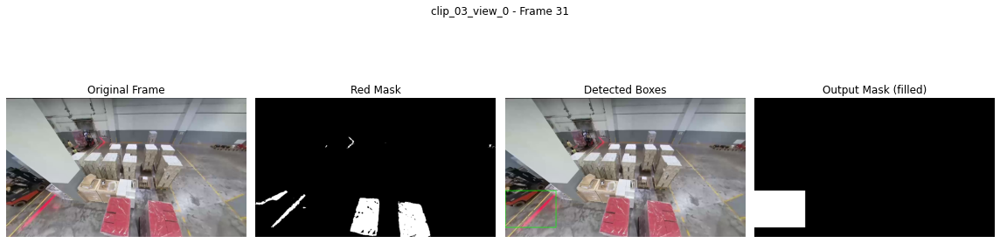

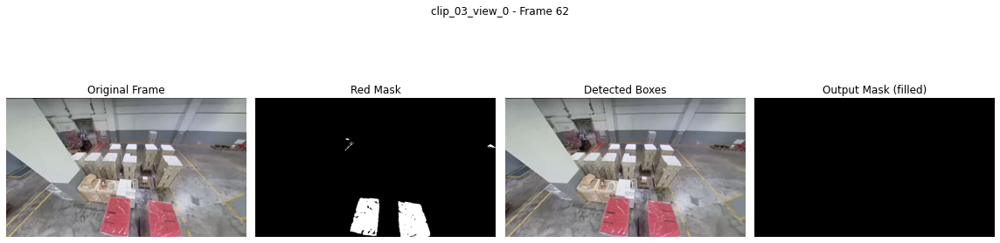


--- Processing clip_03_view_1 ---
  ✓ Output mask saved to zapdos_data\data\clip_03_view_1\output_mask.mp4


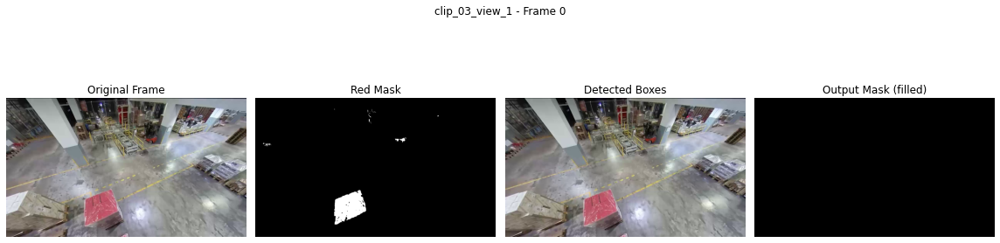

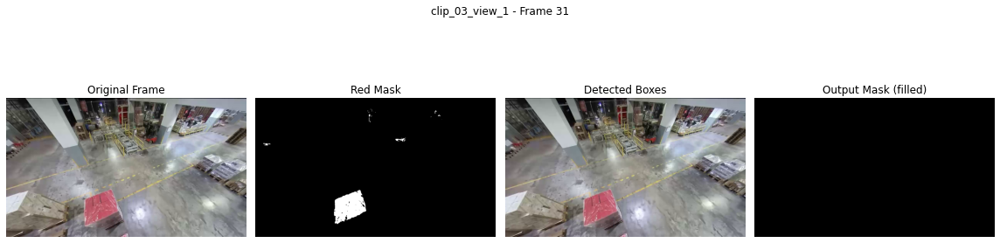

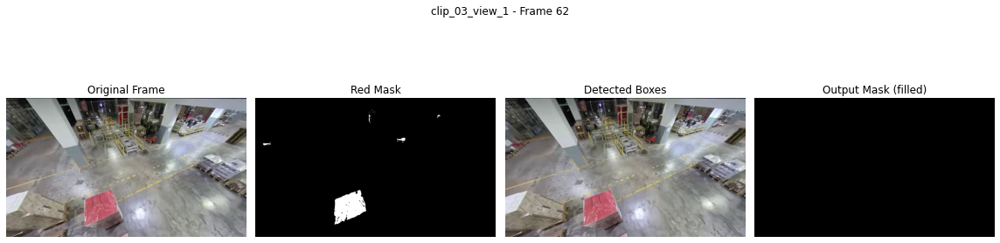


--- Processing clip_03_view_2 ---
  ✓ Output mask saved to zapdos_data\data\clip_03_view_2\output_mask.mp4


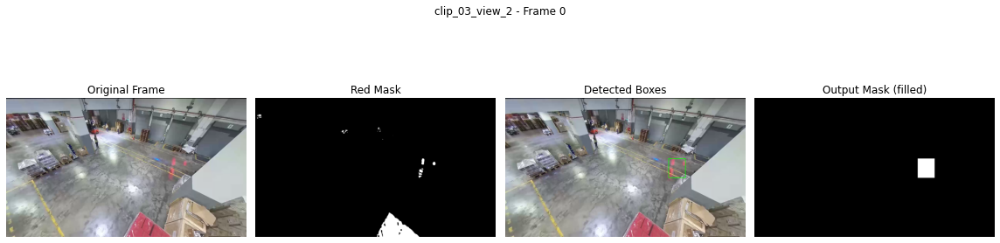

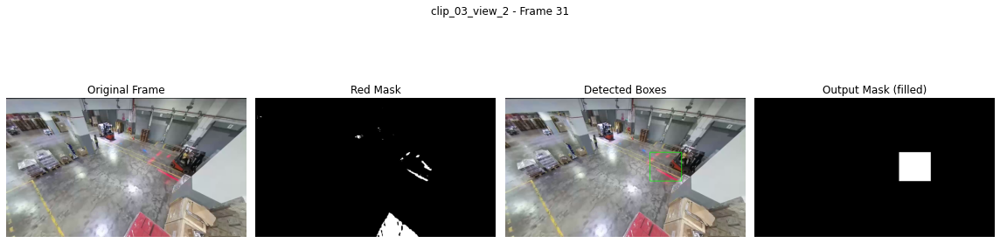

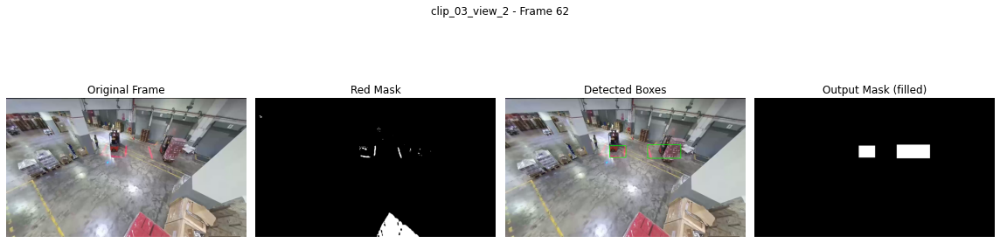


--- Processing clip_04_view_0 ---
  ✓ Output mask saved to zapdos_data\data\clip_04_view_0\output_mask.mp4


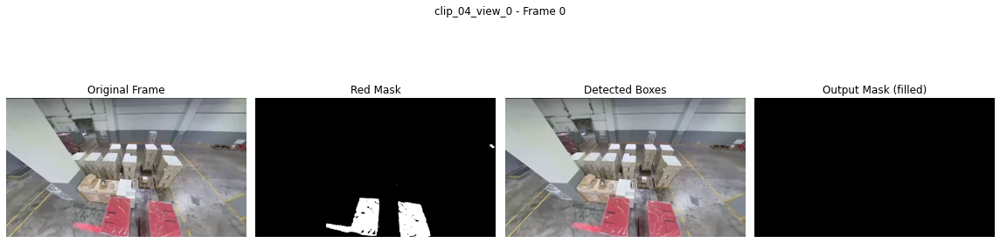

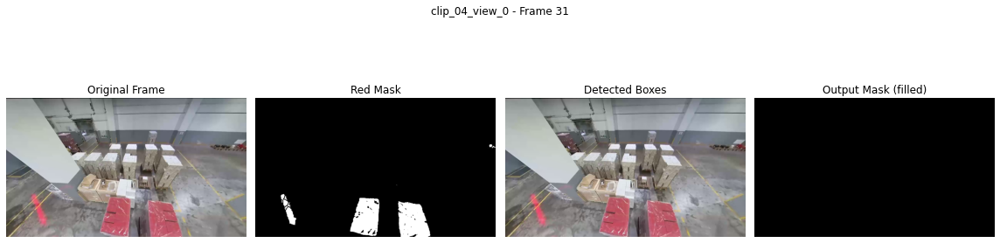

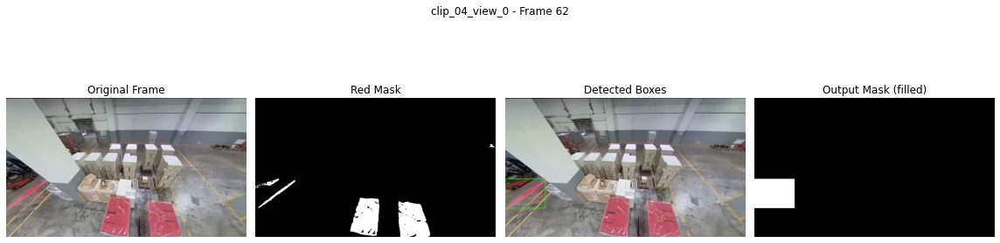


--- Processing clip_04_view_1 ---
  ✓ Output mask saved to zapdos_data\data\clip_04_view_1\output_mask.mp4


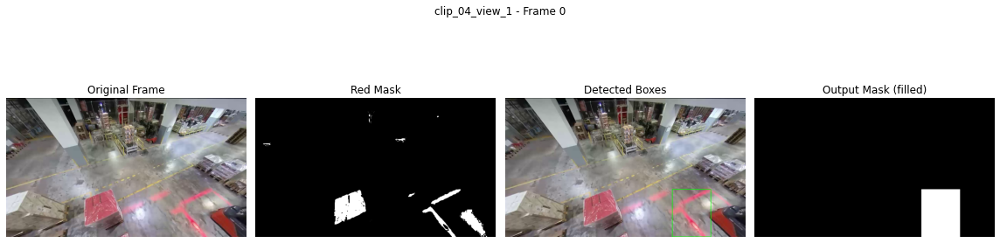

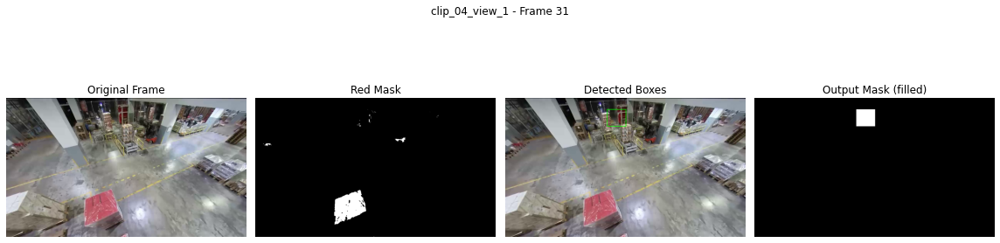

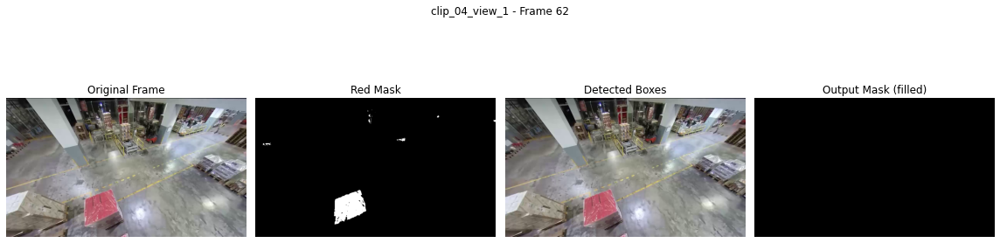


--- Processing clip_04_view_2 ---
  ✓ Output mask saved to zapdos_data\data\clip_04_view_2\output_mask.mp4


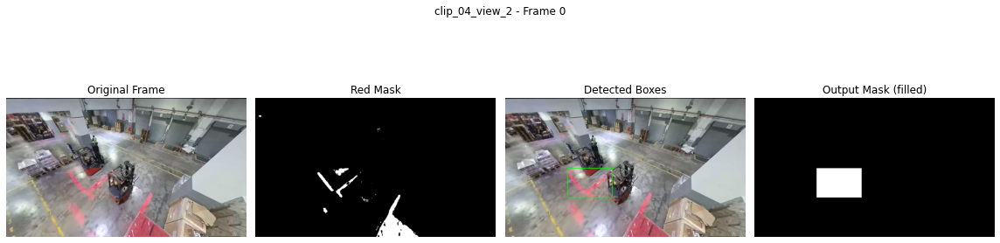

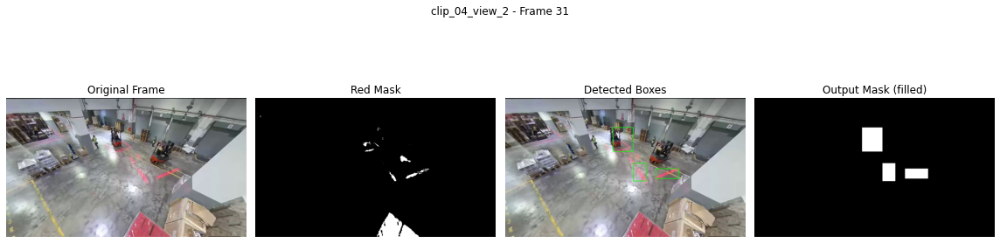

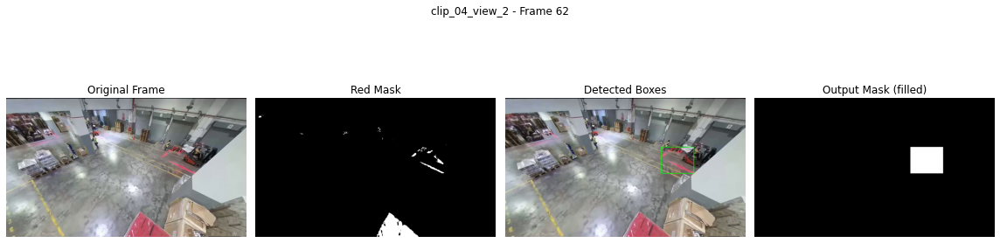


--- Processing clip_05_view_0 ---
  ✓ Output mask saved to zapdos_data\data\clip_05_view_0\output_mask.mp4


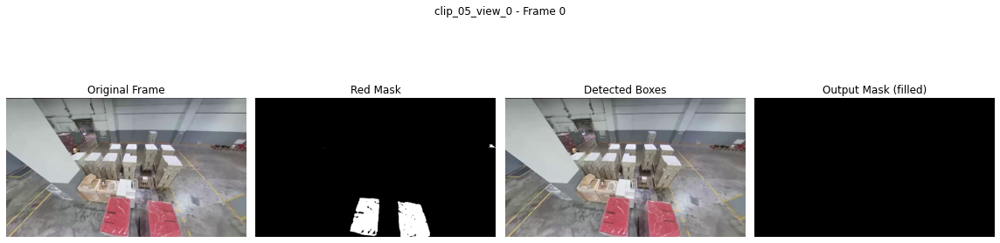

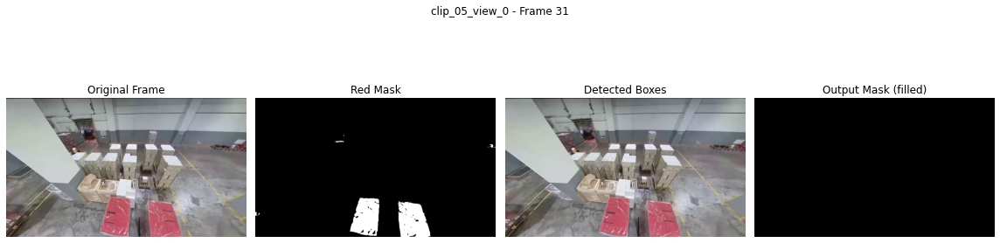

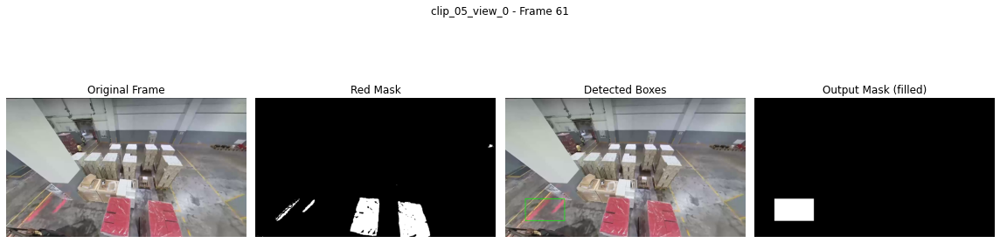


--- Processing clip_05_view_1 ---
  ✓ Output mask saved to zapdos_data\data\clip_05_view_1\output_mask.mp4


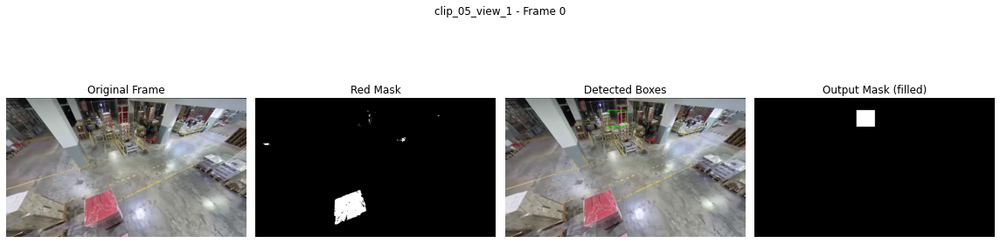

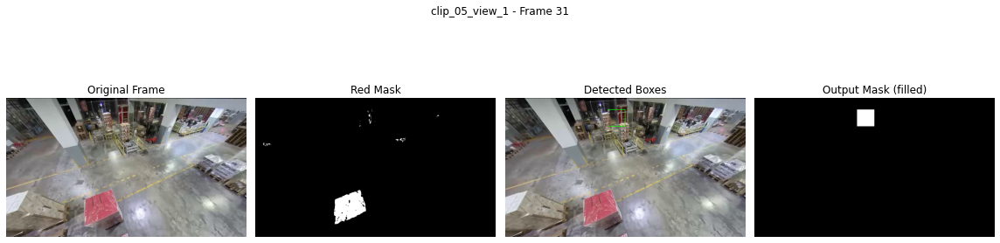

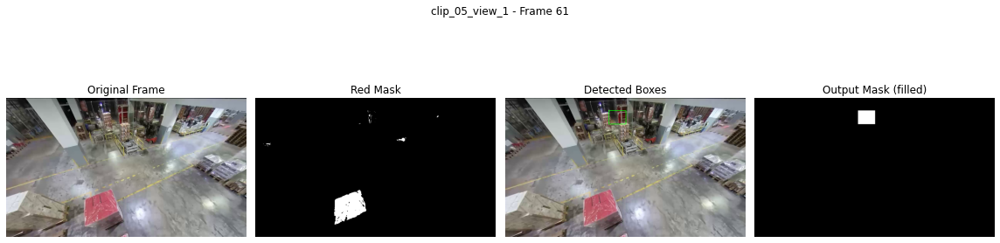


--- Processing clip_05_view_2 ---
  ✓ Output mask saved to zapdos_data\data\clip_05_view_2\output_mask.mp4


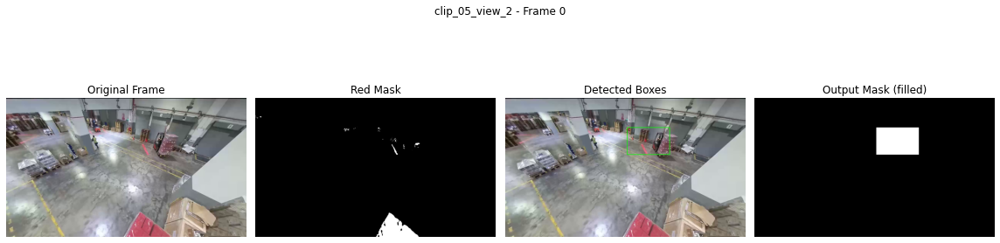

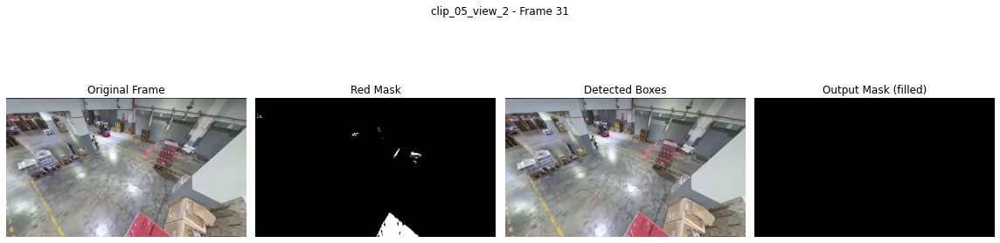

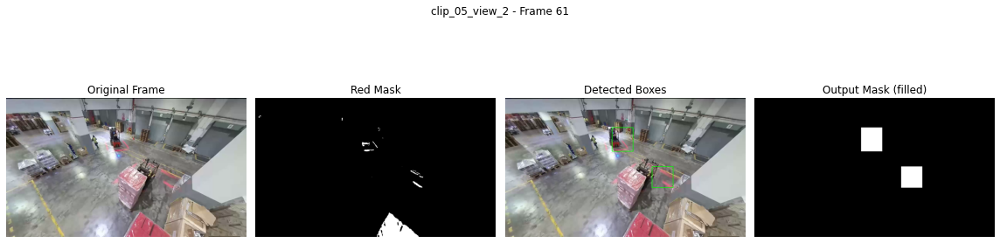


--- Processing clip_06_view_0 ---
  ✓ Output mask saved to zapdos_data\data\clip_06_view_0\output_mask.mp4


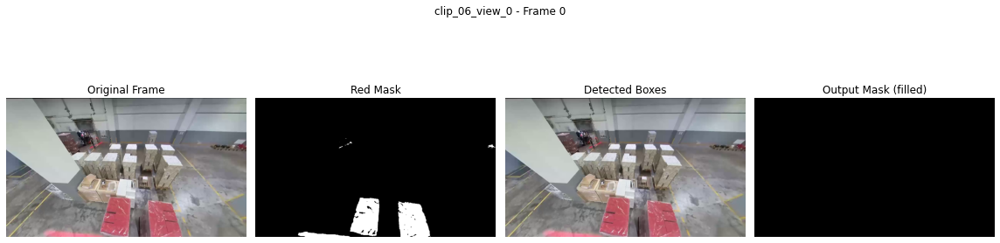

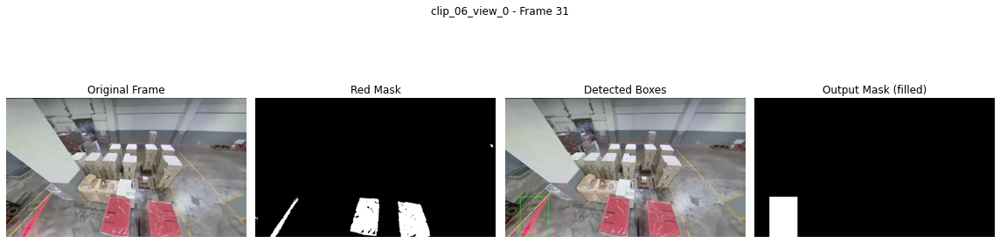

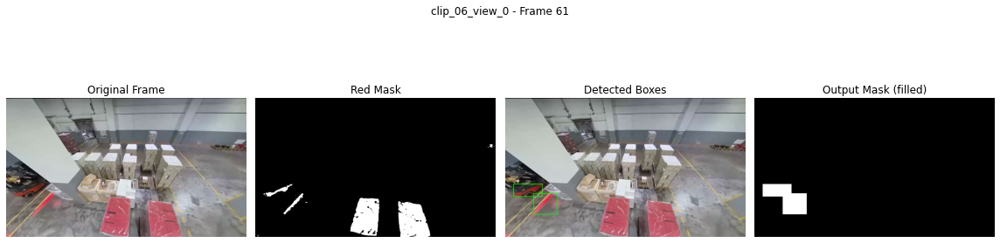


--- Processing clip_06_view_1 ---
  ✓ Output mask saved to zapdos_data\data\clip_06_view_1\output_mask.mp4


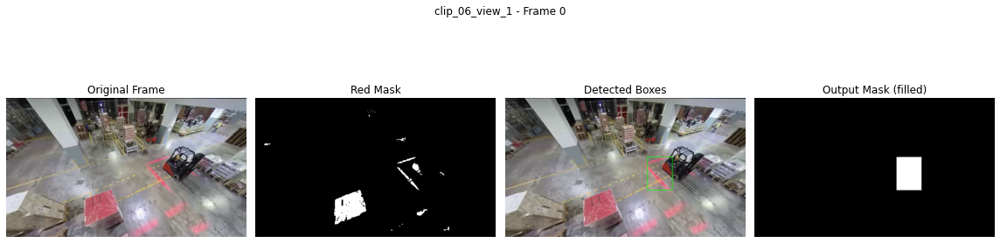

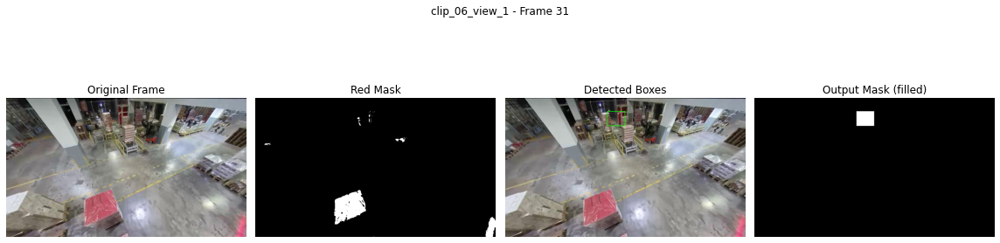

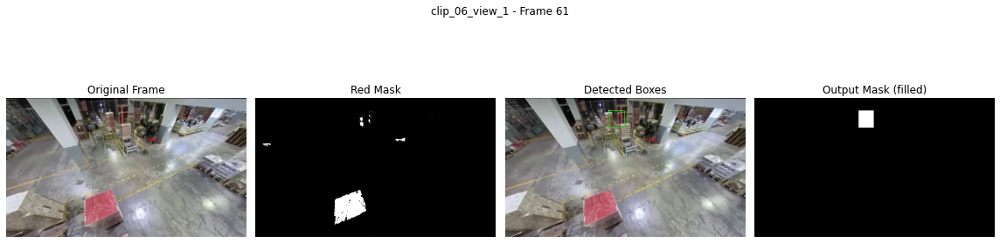


--- Processing clip_06_view_2 ---
  ✓ Output mask saved to zapdos_data\data\clip_06_view_2\output_mask.mp4


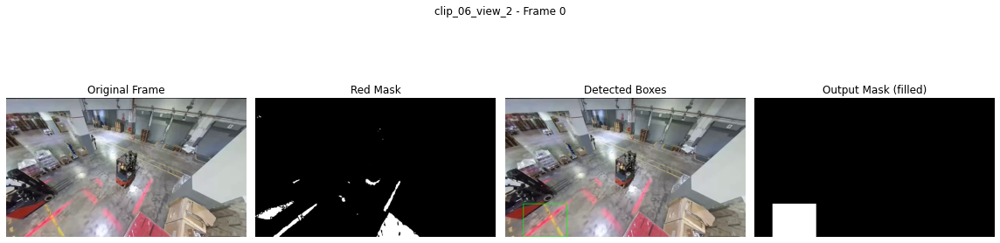

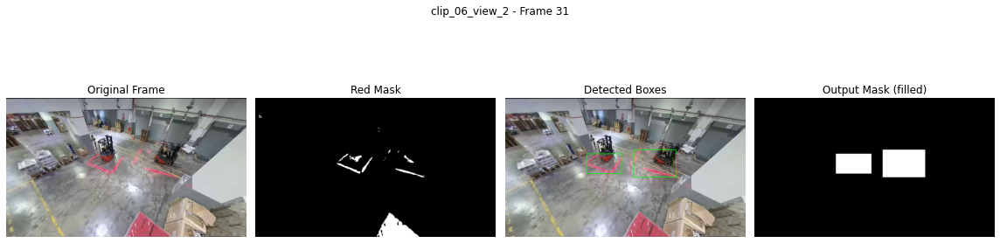

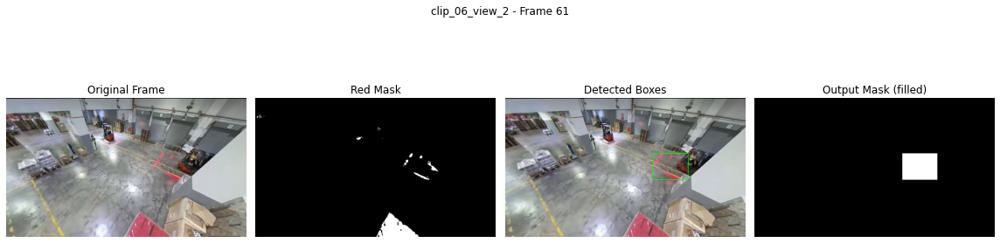


--- Processing clip_07_view_0 ---
  ✓ Output mask saved to zapdos_data\data\clip_07_view_0\output_mask.mp4


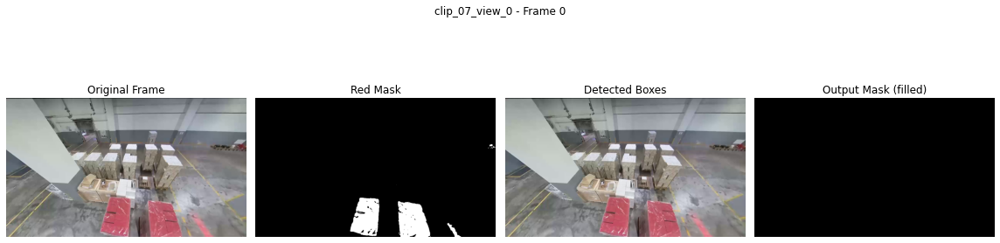

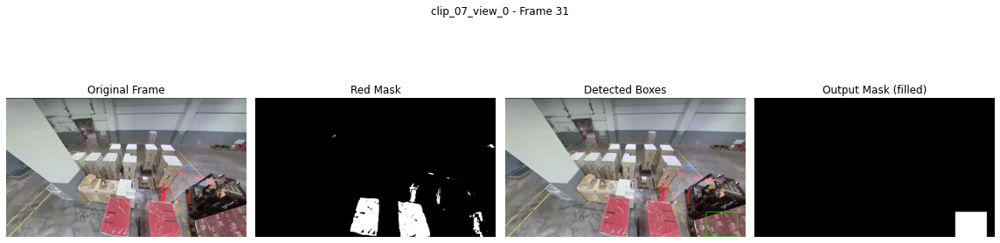

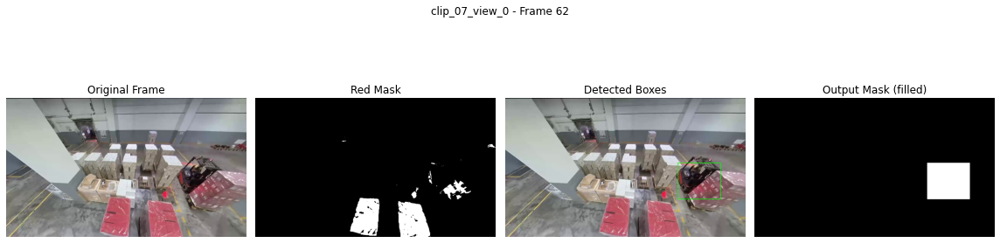


--- Processing clip_07_view_1 ---
  ✓ Output mask saved to zapdos_data\data\clip_07_view_1\output_mask.mp4


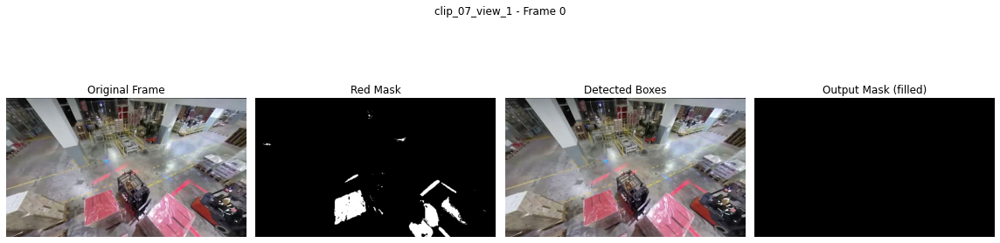

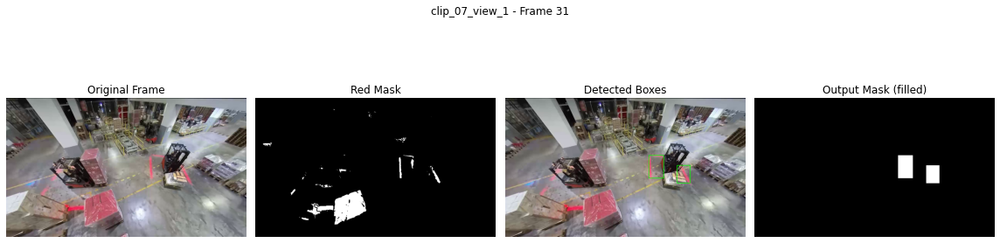

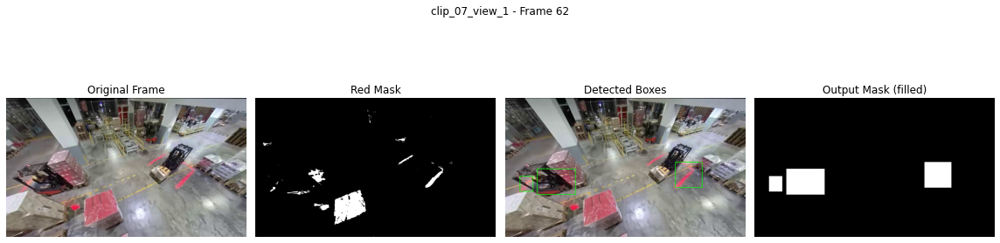


--- Processing clip_07_view_2 ---
  ✓ Output mask saved to zapdos_data\data\clip_07_view_2\output_mask.mp4


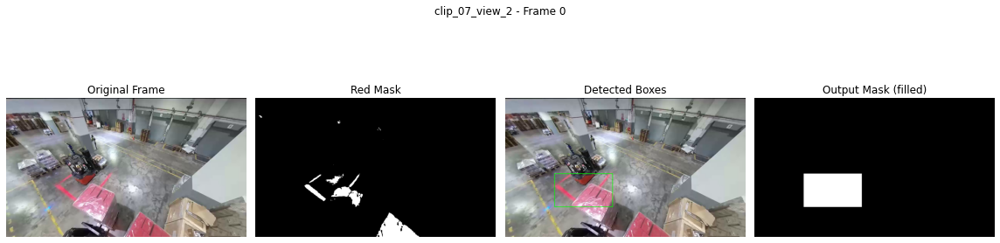

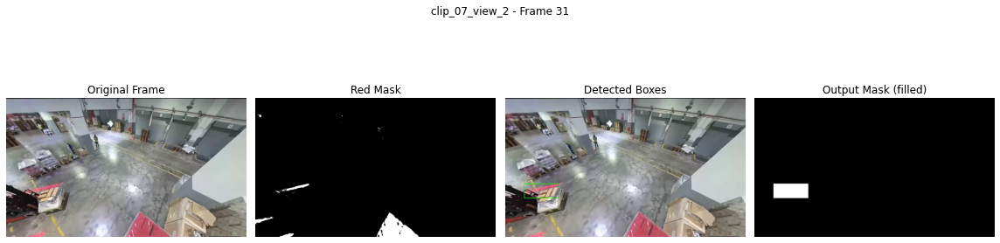

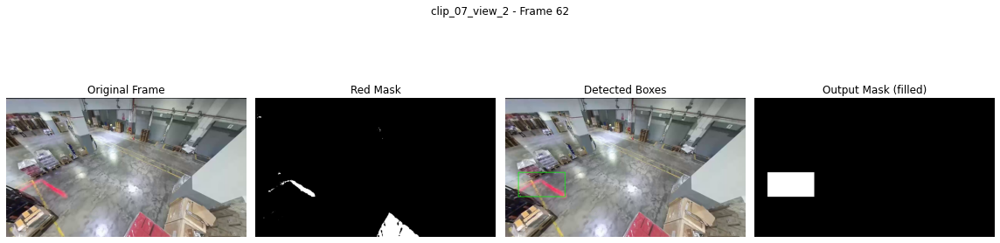


--- Processing clip_08_view_0 ---
  ✓ Output mask saved to zapdos_data\data\clip_08_view_0\output_mask.mp4


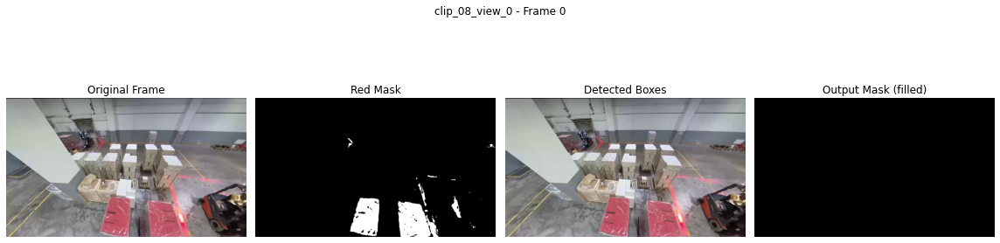

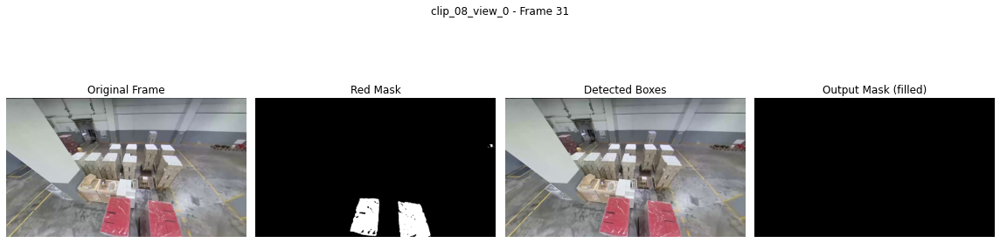

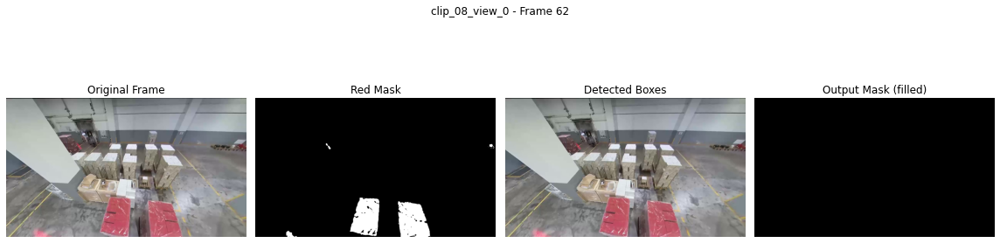


--- Processing clip_08_view_1 ---
  ✓ Output mask saved to zapdos_data\data\clip_08_view_1\output_mask.mp4


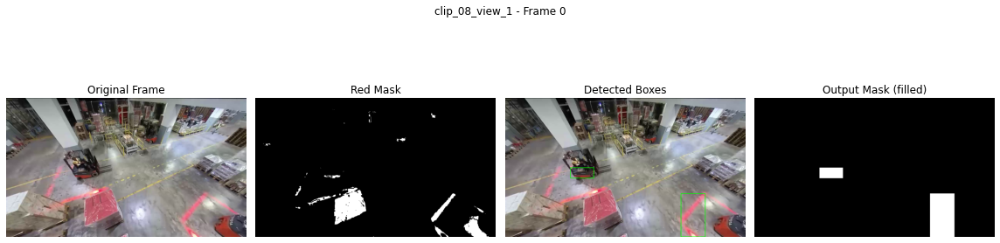

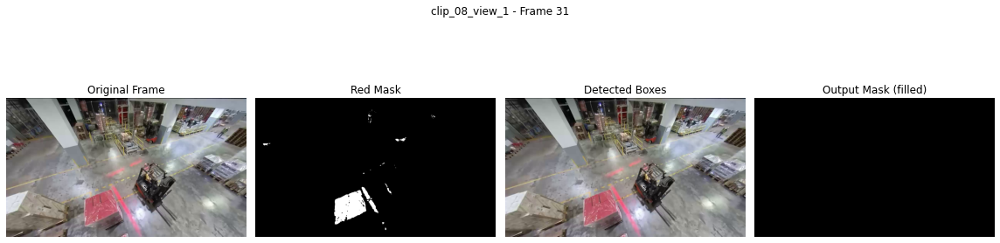

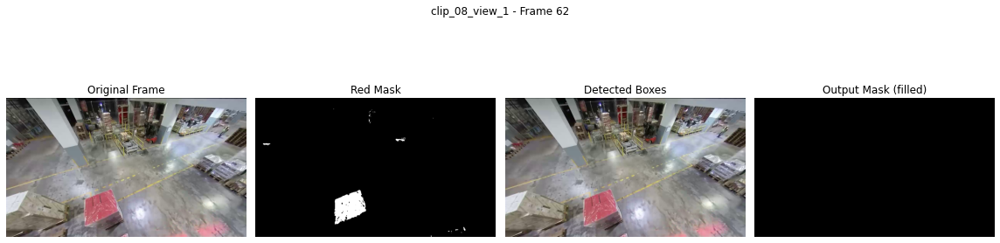


--- Processing clip_08_view_2 ---
  ✓ Output mask saved to zapdos_data\data\clip_08_view_2\output_mask.mp4


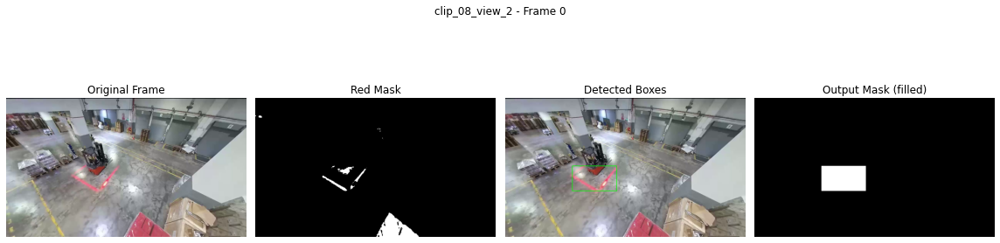

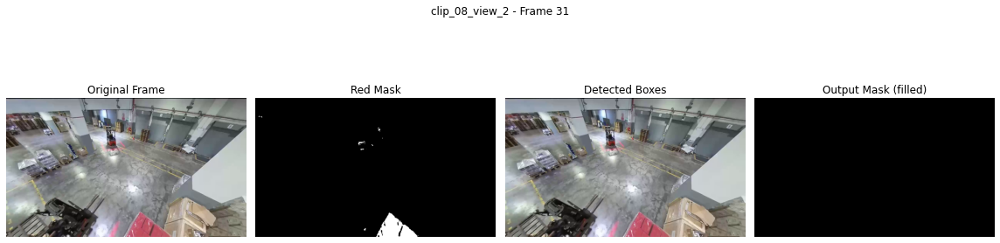

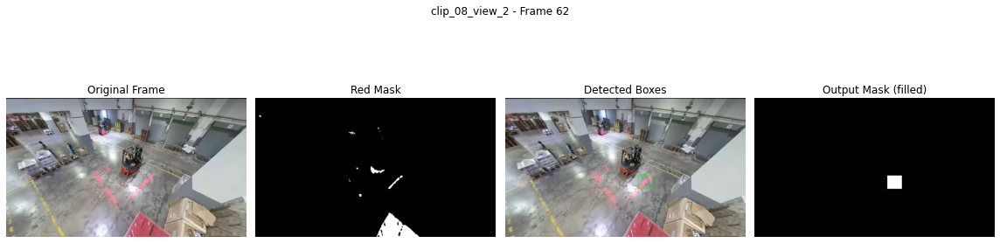


--- Processing clip_09_view_0 ---
  ✓ Output mask saved to zapdos_data\data\clip_09_view_0\output_mask.mp4


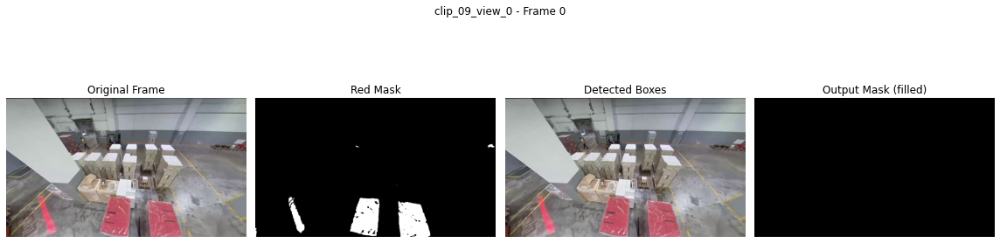

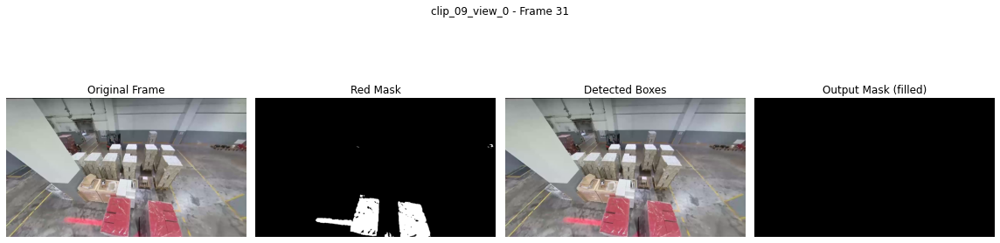

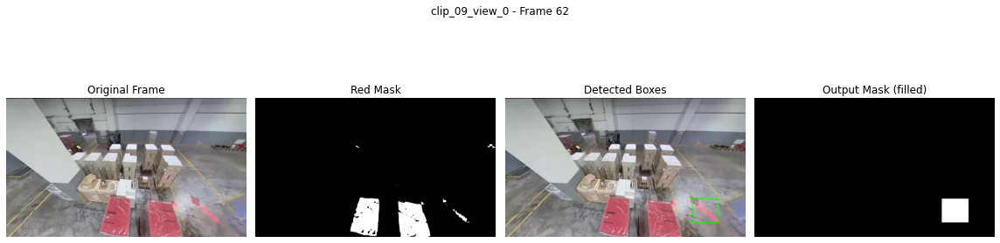


--- Processing clip_09_view_1 ---
  ✓ Output mask saved to zapdos_data\data\clip_09_view_1\output_mask.mp4


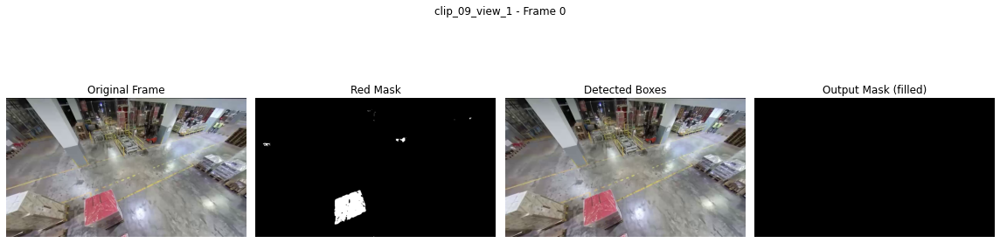

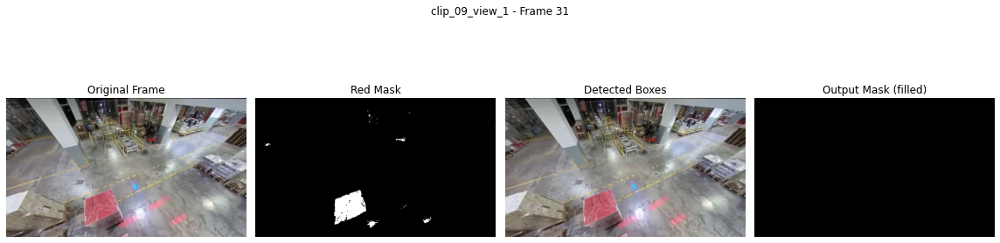

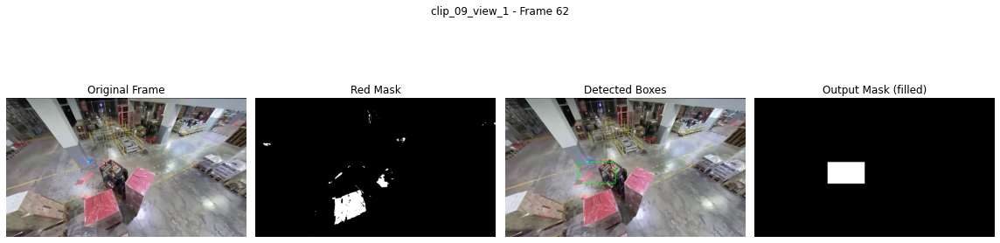


--- Processing clip_09_view_2 ---
  ✓ Output mask saved to zapdos_data\data\clip_09_view_2\output_mask.mp4


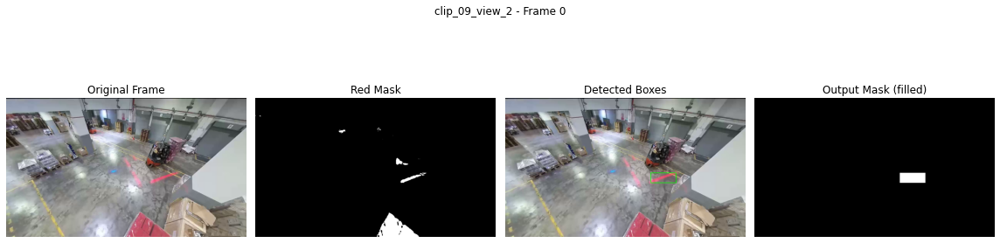

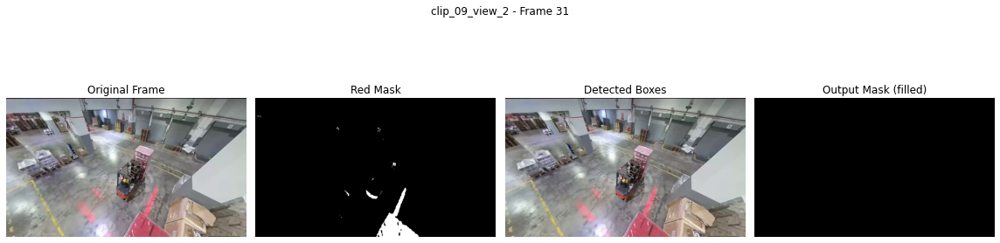

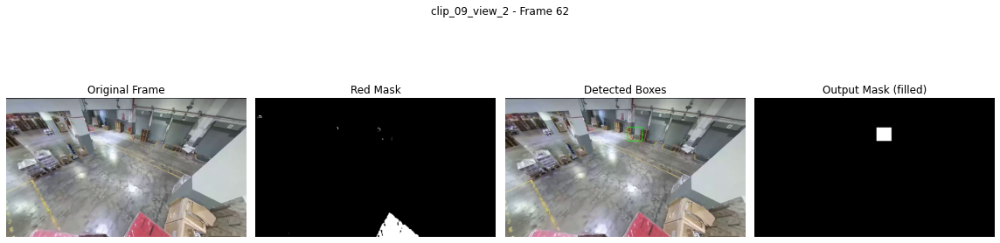


--- Processing clip_10_view_0 ---
  ✓ Output mask saved to zapdos_data\data\clip_10_view_0\output_mask.mp4


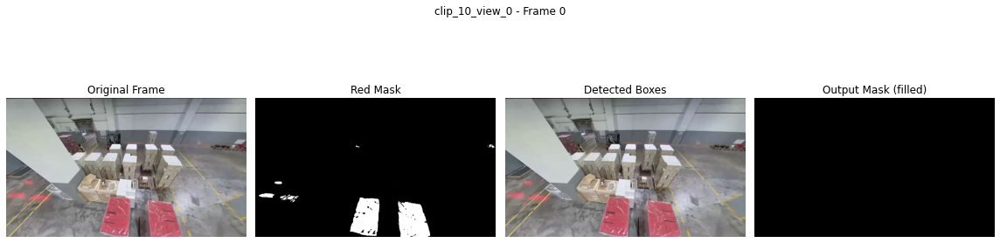

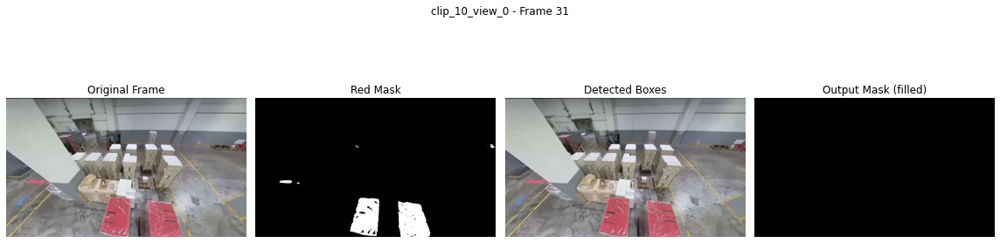

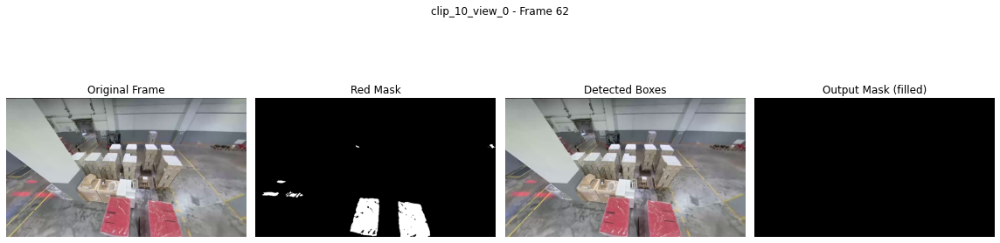


--- Processing clip_10_view_1 ---
  ✓ Output mask saved to zapdos_data\data\clip_10_view_1\output_mask.mp4


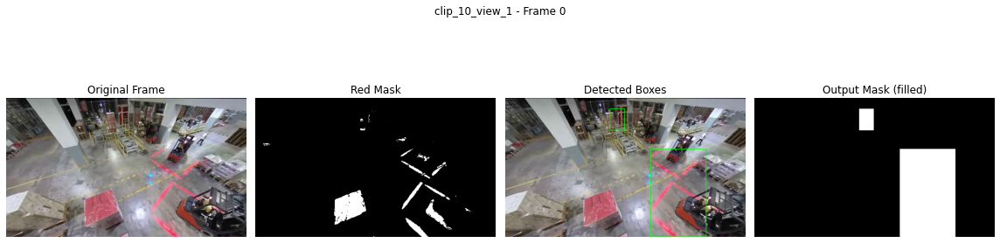

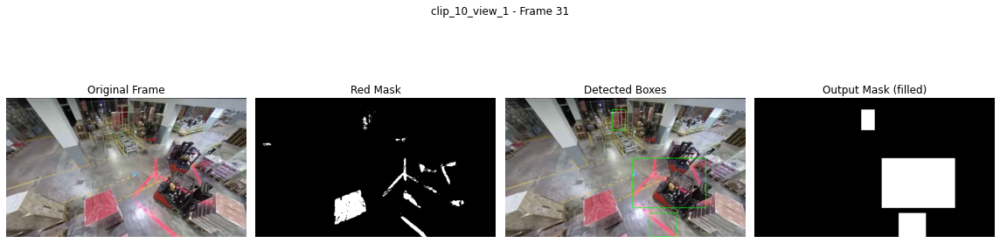

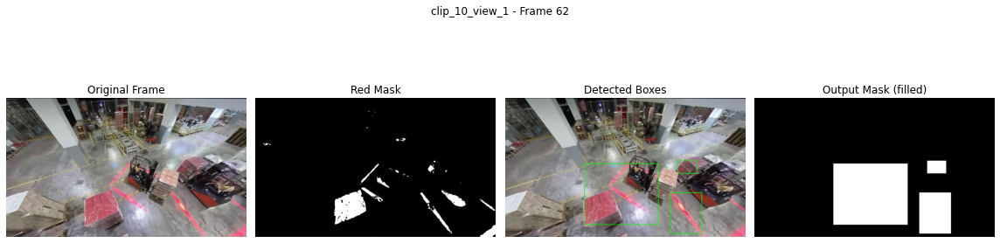


--- Processing clip_10_view_2 ---
  ✓ Output mask saved to zapdos_data\data\clip_10_view_2\output_mask.mp4


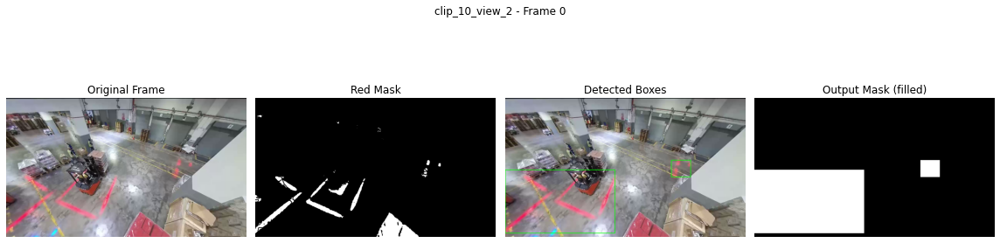

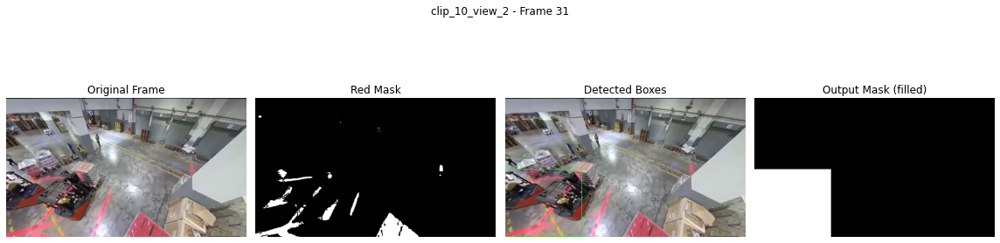

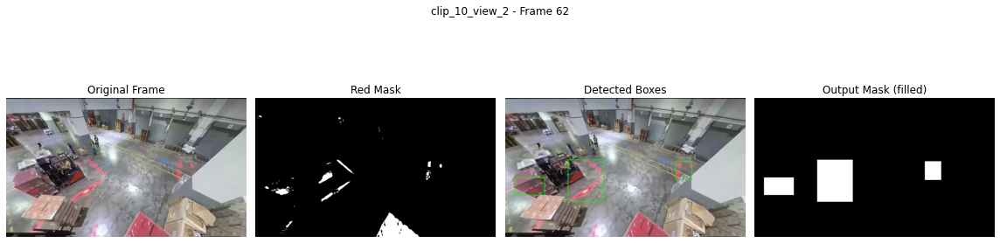


✓ All clips processed.


In [8]:
# Main loop over all clips
for clip in clips:
    print(f"\n--- Processing {clip.name} ---")
    viz_frames = process_clip(clip, target_fps=10, visualize=True)
    if viz_frames:
        plot_viz_frames(clip.name, viz_frames, save=True)
    else:
        print(f"  No frames to visualise (maybe video empty?)")
print("\n✓ All clips processed.")

## Summary

For each clip, we:
- Created a binary mask video (`output_mask.mp4`) where each detected forklift boundary becomes a filled white rectangle.
- Saved visualisation plots (4 subplots) for the first, middle, and last frame into the `visualizations/` folder.

The method uses DBSCAN clustering to group disconnected laser line segments, then filters by area and red pixel density to ignore other red objects. Parameters can be tuned further, but the current values work across all 30 clips provided.